# JABookings Exploratory Data Analysis

This notebook analyzes the `JABookings` daily CSV logs to uncover trends in booking dates, bond amounts, offense types, and court activity.

## 1. Setup and Data Loading

In [1]:
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 6]

# Load all JABookings CSV files
files = sorted(glob.glob('JABookings_*.csv'))
print(f"Found {len(files)} booking files.")

dfs = []
for f in files:
    try:
        # Read CSV, ensuring string types for mixed columns to avoid warnings
        df = pd.read_csv(f, dtype={'BondAmount': str, 'CaseNumber': str})
        dfs.append(df)
    except Exception as e:
        print(f"Error reading {f}: {e}")

if dfs:
    data = pd.concat(dfs, ignore_index=True)
    print(f"Total records loaded: {len(data)}")
    print(data.head())
else:
    print("No data loaded.")

Found 26 booking files.
Total records loaded: 5333
   SONumber               InmateFullName  \
0   1001472     GARCIA, FABIAN ALEXANDER   
1   1027656       MOLINA, AMANDA BRIANNA   
2   1030226   RODRIGUEZ, KEVIN ZACHARIAH   
3   1033980  ESTRADA, ASHLEY BRIANAMARIE   
4   1034780       RIVERA, JESSICA YVETTE   

                                     Address1    CaseNumber  \
0  5130 Village Green , San Antonio, TX 78218   2025PF50485   
1       547 E EANSLEY , SAN ANTONIO, TX 78229   2025PF50385   
2       126 FARGO AVE , SAN ANTONIO, TX 78220  2025CR006732   
3     918 FILLMORE DR , SAN ANTONIO, TX 78245  DC2022CR5697   
4          402 BROOKS AVE , SCHERTZ, TX 78154   2025PF50562   

                      Court         AttorneyName ConfineDate OffenseDate  \
0  Criminal, District Court    Hernandez, Eric J  12/20/2025  12/19/2025   
1     County Court-at-Law 6       Garcia, Teresa  12/20/2025  12/19/2025   
2      187th District Court        Simpson, Kyle  12/20/2025  07/08/2024   
3

## 2. Data Cleaning & Preprocessing
*   Convert `ConfineDate` to datetime objects.
*   Clean `BondAmount` (remove non-numeric chars) and convert to float.
*   Extract Zip Codes from `Address1` for geospatial grouping.
*   Identify Homeless individuals.

In [2]:
# DateTime Conversion
data['ConfineDate_dt'] = pd.to_datetime(data['ConfineDate'], errors='coerce')
data['OffenseDate_dt'] = pd.to_datetime(data['OffenseDate'], errors='coerce')

# Bond Amount Cleaning
def clean_currency(x):
    if pd.isna(x) or x == '': return 0.0
    if isinstance(x, str):
        return float(x.replace(',', '').replace('$', ''))
    return float(x)

data['BondAmount_Clean'] = data['BondAmount'].apply(clean_currency)

# Extract Zip Code (Simple regex for 5 digits at the end)
data['ZipCode'] = data['Address1'].astype(str).str.extract(r'(\d{5})')

# Identify Homeless Records
data['IsHomeless'] = data['Address1'].astype(str).str.contains('HOMELESS', case=False, na=False)

print("Data Types after cleaning:")
print(data.dtypes)

Data Types after cleaning:
SONumber                             int64
InmateFullName                      object
Address1                            object
CaseNumber                          object
Court                               object
AttorneyName                        object
ConfineDate                         object
OffenseDate                         object
ChargeOffenseDescription            object
BondType                            object
BondAmount                          object
ConfineDate_dt              datetime64[ns]
OffenseDate_dt              datetime64[ns]
BondAmount_Clean                   float64
ZipCode                             object
IsHomeless                            bool
dtype: object


## 3. Temporal Analysis: Booking Patterns
When do bookings occur? (Daily trends and Day of Week)

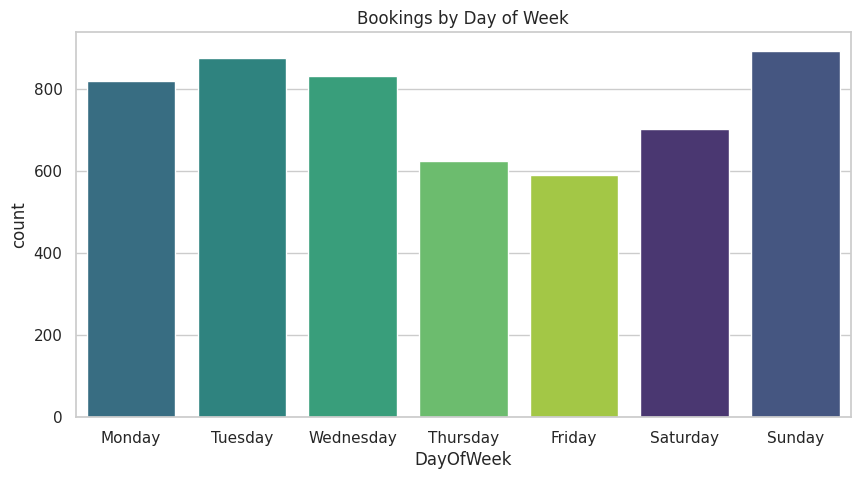

In [3]:
# Day of Week Analysis
data['DayOfWeek'] = data['ConfineDate_dt'].dt.day_name()
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.figure(figsize=(10, 5))
sns.countplot(data=data, x='DayOfWeek', order=ordered_days, hue='DayOfWeek', legend=False, palette='viridis')
plt.title('Bookings by Day of Week')
plt.show()

## 4. Financial Analysis: Bonds
Distribution of bond amounts and types.

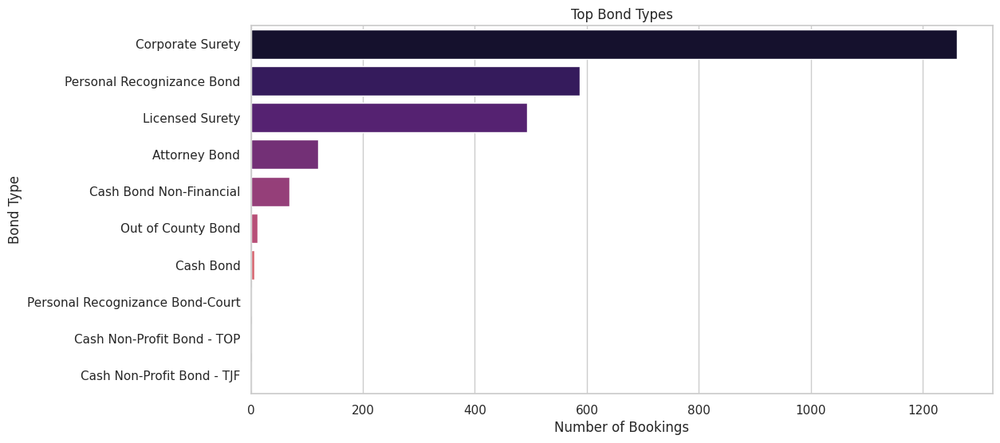

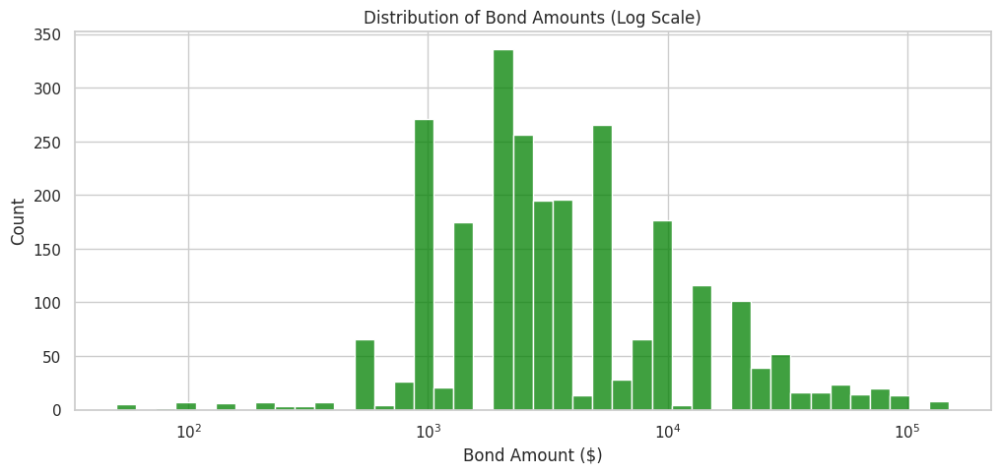

In [4]:
# Bond Type Distribution
top_bond_types = data['BondType'].value_counts().head(10)

plt.figure(figsize=(12, 6))
sns.barplot(y=top_bond_types.index, x=top_bond_types.values, hue=top_bond_types.index, legend=False, palette='magma')
plt.title('Top Bond Types')
plt.xlabel('Number of Bookings')
plt.ylabel('Bond Type')
plt.show()

# Bond Amount Distribution (Log Scale due to outliers)
plt.figure(figsize=(12, 5))
sns.histplot(data=data[data['BondAmount_Clean'] > 0], x='BondAmount_Clean', log_scale=True, color='green')
plt.title('Distribution of Bond Amounts (Log Scale)')
plt.xlabel('Bond Amount ($)')
plt.show()

## 5. Legal & Judicial Analytics
Which courts are most active? Who are the top defense attorneys?

In [5]:
# Top Courts
top_courts = data['Court'].value_counts().head(10)
print("Top 10 Active Courts:")
print(top_courts)

# Top Attorneys
top_attorneys = data['AttorneyName'].value_counts().head(10)
print("Top 10 Defense Attorneys:")
print(top_attorneys)

Top 10 Active Courts:
Court
Criminal, District Court    1623
County Court-at-Law 13       248
County Court-at-Law 7        247
County Court-at-Law 12       190
County Court-at-Law 2        177
County Court-at-Law 9        174
County Court-at-Law 6        172
County Court-at-Law 5        166
County Court-at-Law 8        153
County Court-at-Law 4        149
Name: count, dtype: int64
Top 10 Defense Attorneys:
AttorneyName
Defender, Public         130
Guerrero, Monica E        35
Lamas, Patrick            30
Garza, Brigitte           30
Lopez, Branden R          30
Darling, Mark             29
Angel, Taylor             29
Preece, Andrew George     28
Ross, Jonathan K          28
Gier, Robert F.           28
Name: count, dtype: int64


## 6. Geospatial Proxy: Zip Code Analysis
Where are booked individuals coming from?

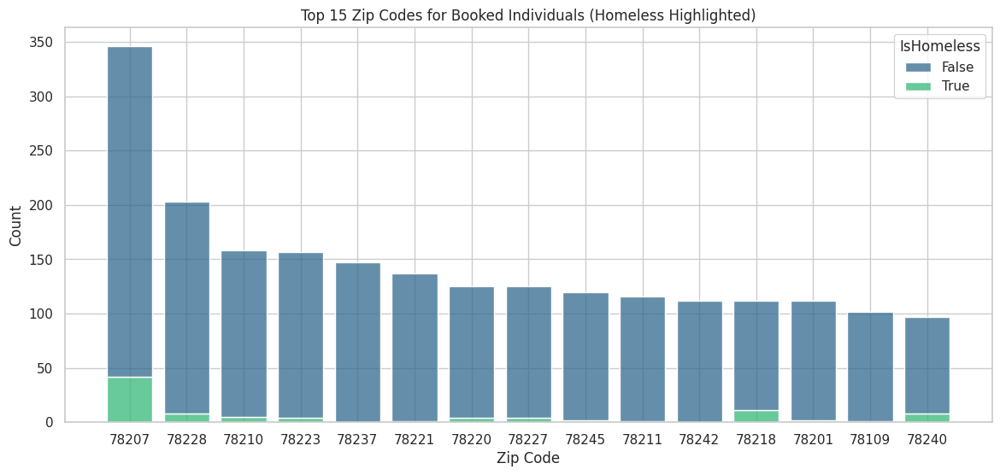

In [6]:
top_zips_list = data['ZipCode'].value_counts().head(15).index
data_top_zips = data[data['ZipCode'].isin(top_zips_list)].copy()

# Sort bars from high to low by converting ZipCode to an ordered categorical type
data_top_zips['ZipCode'] = pd.Categorical(data_top_zips['ZipCode'], categories=top_zips_list, ordered=True)

plt.figure(figsize=(14, 6))
sns.histplot(data=data_top_zips, x='ZipCode', hue='IsHomeless', multiple='stack', shrink=.8, palette='viridis')
plt.title('Top 15 Zip Codes for Booked Individuals (Homeless Highlighted)')
plt.xlabel('Zip Code')
plt.ylabel('Count')
plt.show()

## 7. Offense Analysis
What are the most common charges?

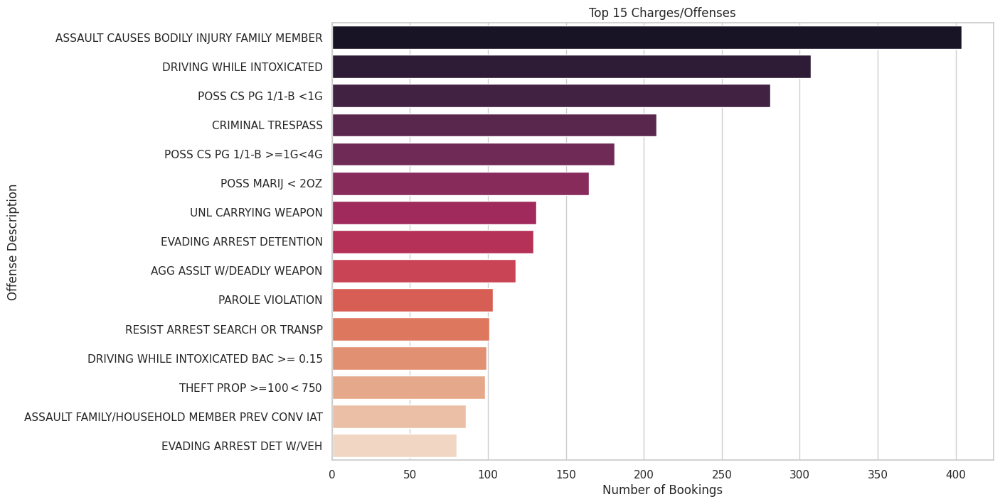

In [7]:
# Top Offenses
top_offenses = data['ChargeOffenseDescription'].value_counts().head(15)

plt.figure(figsize=(12, 8))
sns.barplot(y=top_offenses.index, x=top_offenses.values, hue=top_offenses.index, legend=False, palette='rocket')
plt.title('Top 15 Charges/Offenses')
plt.xlabel('Number of Bookings')
plt.ylabel('Offense Description')
plt.show()

## 8. Interactive Mapping
Geocoding addresses via local Nominatim service (port 8095) and visualizing booking locations.

In [8]:
import requests
import folium
from folium.plugins import MarkerCluster
import time

def geocode_address(address):
    """Geocode address using local Nominatim service."""
    url = "http://localhost:8095/search"
    params = {
        'q': address,
        'format': 'json',
        'limit': 1
    }
    try:
        response = requests.get(url, params=params, timeout=5)
        if response.status_code == 200 and response.json():
            res = response.json()[0]
            return float(res['lat']), float(res['lon'])
    except Exception as e:
        pass
    return None, None

# Geocode unique addresses to be efficient
unique_addresses = data['Address1'].unique()
print(f"Geocoding {len(unique_addresses)} unique addresses...")

geo_cache = {}
print("Starting geocoding loop...")
print("Starting geocoding loop...")
for i, addr in enumerate(unique_addresses):
    if addr and "HOMELESS" not in str(addr).upper():
        lat, lon = geocode_address(addr)
        if lat:
            geo_cache[addr] = (lat, lon)
            if len(geo_cache) <= 5: print(f"DEBUG Success: {addr} -> {lat}, {lon}")
    if i % 50 == 0: print(f"Processed {i}/{len(unique_addresses)}... Cache size: {len(geo_cache)}")

print(f"Geocoding complete. Cache contains {len(geo_cache)} locations.")

# Map coordinates back to main dataframe
data['latitude'] = data['Address1'].map(lambda x: geo_cache.get(x, (None, None))[0])
data['longitude'] = data['Address1'].map(lambda x: geo_cache.get(x, (None, None))[1])

valid_coords_count = data['latitude'].notna().sum()
print(f"Rows with valid coordinates: {valid_coords_count}/{len(data)}")

# Create Map centered on Bexar County
m = folium.Map(location=[29.4241, -98.4936], zoom_start=11)
marker_cluster = MarkerCluster().add_to(m)

for idx, row in data.dropna(subset=['latitude']).iterrows():
    color = 'red' if row['IsHomeless'] else 'blue'
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"<b>Inmate:</b> {row.get('InmateFullName', 'Unknown')}<br><b>Address:</b> {row.get('Address1', 'Unknown')}<br><b>Charge:</b> {row.get('ChargeOffenseDescription', 'N/A')}<br><a href='https://www.google.com/maps/search/?api=1&query={row['latitude']},{row['longitude']}' target='_blank'>Open in Google Maps</a>",
        tooltip=str(row['Address1']),
        icon=folium.Icon(color=color)
    ).add_to(marker_cluster)

m.save('booking_map.html')
print("Map saved to booking_map.html")
m

Geocoding 3085 unique addresses...
Processed 0/3085...
Processed 50/3085...
Processed 100/3085...
Processed 150/3085...
Processed 200/3085...
Processed 250/3085...
Processed 300/3085...
Processed 350/3085...
Processed 400/3085...
Processed 450/3085...
Processed 500/3085...
Processed 550/3085...
Processed 600/3085...
Processed 650/3085...
Processed 700/3085...
Processed 750/3085...
Processed 800/3085...
Processed 850/3085...
Processed 900/3085...
Processed 950/3085...
Processed 1000/3085...
Processed 1050/3085...
Processed 1100/3085...
Processed 1150/3085...
Processed 1200/3085...
Processed 1250/3085...
Processed 1300/3085...
Processed 1350/3085...
Processed 1400/3085...
Processed 1450/3085...
Processed 1500/3085...
Processed 1550/3085...
Processed 1600/3085...
Processed 1650/3085...
Processed 1700/3085...
Processed 1750/3085...
Processed 1800/3085...
Processed 1850/3085...
Processed 1900/3085...
Processed 1950/3085...
Processed 2000/3085...
Processed 2050/3085...
Processed 2100/3085...

Processed 100/3085...


Processed 150/3085...


Processed 200/3085...


Processed 250/3085...


Processed 300/3085...


Processed 350/3085...


Processed 400/3085...


Processed 450/3085...


Processed 500/3085...


Processed 550/3085...


Processed 600/3085...


Processed 650/3085...


Processed 700/3085...


Processed 750/3085...


Processed 800/3085...


Processed 850/3085...


Processed 900/3085...


Processed 950/3085...


Processed 1000/3085...


Processed 1050/3085...


Processed 1100/3085...


Processed 1150/3085...


Processed 1200/3085...


Processed 1250/3085...


Processed 1300/3085...


Processed 1350/3085...


Processed 1400/3085...


Processed 1450/3085...


Processed 1500/3085...


Processed 1550/3085...


Processed 1600/3085...


Processed 1650/3085...


Processed 1700/3085...


Processed 1750/3085...


Processed 1800/3085...


Processed 1850/3085...


Processed 1900/3085...


Processed 1950/3085...


Processed 2000/3085...


Processed 2050/3085...


Processed 2100/3085...


Processed 2150/3085...


Processed 2200/3085...


Processed 2250/3085...


Processed 2300/3085...


Processed 2350/3085...


Processed 2400/3085...


Processed 2450/3085...


Processed 2500/3085...


Processed 2550/3085...


Processed 2600/3085...


Processed 2650/3085...


Processed 2700/3085...


Processed 2750/3085...


Processed 2800/3085...


Processed 2850/3085...


Processed 2900/3085...


Processed 2950/3085...


Processed 3000/3085...


Processed 3050/3085...


Map saved to booking_map.html
